<link rel="stylesheet" href="berkeley.css">

<h1 class="cal cal-h1">Lecture 07: Linear Regression (2) – CS 189, Fall 2025</h1>


In this lecture we will explore the geometry of linear regression and regularization.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from plotly.subplots import make_subplots
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

import warnings
from sklearn.exceptions import ConvergenceWarning

warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

np.random.seed(42)

This notebook is designed to provide a comprehensive understanding of **Linear Regression** and its extensions, with a focus on the following key concepts:

### 1. **Linear Regression Geometry**
- Explore the **geometric interpretation** of linear regression, including the concepts of:
    - **Span of Input Features**: Understanding how predictions lie in the subspace spanned by the input features.
    - **Residuals**: The difference between the predicted values and the actual target values.
    - **Orthogonal Projection**: How the best-fit line minimizes residuals by projecting the target vector onto the feature space.

### 2. **Residual Analysis**
- Learn to analyze **residuals** to evaluate the quality of a regression model.
- Understand patterns in residual plots to identify issues like **heteroscedasticity** or **non-linearity**.

### 3. **Regularization**
- Introduce **L2 Regularization (Ridge Regression)** and **L1 Regularization (Lasso Regression)** to address overfitting and ill-conditioning.
- Visualize the impact of regularization on the loss function, model coefficients, and predictions.
- Compare the behavior of Ridge and Lasso regression under different regularization strengths.

### 4. **Impact of Regularization**
- Demonstrate how regularization affects model performance, particularly in terms of:
    - **Coefficient Shrinkage**
    - **Model Complexity**

### 5. **Ill-Conditioning**
- Understand the challenges of nearly collinear features in the design matrix.
- Show how regularization (e.g., Ridge Regression) can mitigate the effects of ill-conditioning and improve numerical stability.

### 1. **Linear Regression Geometry**:

- In the next cell we will show:
    - **Residuals**: The difference between the predicted values and the actual target values.
    - **Span of Input Features ($\mathbb{X}$)**: The subspace formed by all linear combinations of the input feature vectors.

- **Linear Prediction**:
    The prediction $\mathbf{Y}(\mathbb{X}, \mathbf{w}) = \mathbb{X} \mathbf{w}$ is a **linear combination** of the columns of $\mathbb{X}$. This means that the predicted vector $\mathbf{Y}$ lies in the **span** of the input matrix $\mathbb{X}$, denoted as $\text{span}(\mathbb{X})$.

- **Interpretation**:
    - The predicted vector $\mathbf{Y}$ will always lie in $\text{span}(\mathbb{X})$, even if the ground-truth vector $\mathbf{t}$ does not.
    - The goal of linear regression is to find the vector $\mathbf{Y}$ in $\text{span}(\mathbb{X})$ that is **closest** to the ground-truth vector $\mathbf{t}$.

- **Minimizing Residuals**:
    - The **residual vector** $\mathbf{e} = \mathbf{t} - \mathbf{Y}$ represents the difference between the ground-truth vector $\mathbf{t}$ and the predicted vector $\mathbf{Y}$.
    - To minimize the distance between $\mathbf{Y}$ and $\mathbf{t}$, we minimize the length (or magnitude) of the residual vector $\mathbf{e}$.

- **Orthogonal Projection**:
    - The residual vector $\mathbf{e}$ is minimized when $\mathbf{Y}$ is the **orthogonal projection** of $\mathbf{t}$ onto $\text{span}(\mathbb{X})$.
    - This ensures that $\mathbf{e}$ is orthogonal to $\text{span}(\mathbb{X})$, satisfying the condition for the best fit in linear regression.


In [2]:
# =================== Tunables ===================
SCALE        = 2.0
LINE_W       = 14
HEAD_SIZE_T  = 1.9   
HEAD_SIZE_E  = 1.5   
COEFF_RANGE  = 3.0   
GRID_LINES   = 11
PAD_RATIO    = 0.20
BRACKET_FRAC = 0.22  
# =================================================

x1 = np.array([3.0, 0.4, 0.6]) * SCALE
x2 = np.array([1.2, 2.4, -0.5]) * SCALE

w1, w2 = 1.5, 0.9
residual_height = 2.2 * SCALE

O = np.zeros(3)
Y = w1*x1 + w2*x2

def unit(v):
    n = np.linalg.norm(v);  return v/n if n else v

def gram_schmidt(a, b):
    u1 = unit(a)
    b_perp = b - np.dot(b, u1)*u1
    u2 = unit(b_perp)
    return u1, u2

u_hat, v_hat = gram_schmidt(x1, x2)
n_hat = unit(np.cross(u_hat, v_hat))     

t = Y + residual_height*n_hat            

nu = nv = 45
U = np.linspace(-COEFF_RANGE, COEFF_RANGE, nu)
V = np.linspace(-COEFF_RANGE, COEFF_RANGE, nv)
UU, VV = np.meshgrid(U, V)
P = UU[...,None]*x1 + VV[...,None]*x2

plane = go.Surface(
    x=P[...,0], y=P[...,1], z=P[...,2],
    opacity=0.22, showscale=False, name="span(X)",
    surfacecolor=np.zeros_like(P[...,0]),
    colorscale=[[0,"green"],[1,"green"]],
    hoverinfo="skip"
)

grid = []
for s in np.linspace(-COEFF_RANGE, COEFF_RANGE, GRID_LINES):
    a, b = s*x1 + (-COEFF_RANGE)*x2, s*x1 + (COEFF_RANGE)*x2
    grid.append(go.Scatter3d(x=[a[0],b[0]], y=[a[1],b[1]], z=[a[2],b[2]],
                             mode="lines", line=dict(width=2, color="rgba(0,90,0,0.6)"),
                             showlegend=False, hoverinfo="skip"))
    a, b = (-COEFF_RANGE)*x1 + s*x2, (COEFF_RANGE)*x1 + s*x2
    grid.append(go.Scatter3d(x=[a[0],b[0]], y=[a[1],b[1]], z=[a[2],b[2]],
                             mode="lines", line=dict(width=2, color="rgba(0,90,0,0.6)"),
                             showlegend=False, hoverinfo="skip"))


line_traces, cone_traces = [], []

def arrow(start, end, name, color, width=LINE_W, head=1.6, back=None, dash=None, show_legend=True):
    vec = end - start
    L = np.linalg.norm(vec)
    if L == 0: return
    if back is None:
        back = max(0.9*head, 0.02*L)   
    tip_base = end - back*(vec/L)

    line_traces.append(go.Scatter3d(
        x=[start[0], tip_base[0]], y=[start[1], tip_base[1]], z=[start[2], tip_base[2]],
        mode="lines",
        line=dict(width=width, color=color, dash=dash) if dash else dict(width=width, color=color),
        name=name, showlegend=show_legend, hoverinfo="skip"
    ))
    cone_traces.append(go.Cone(
        x=[end[0]], y=[end[1]], z=[end[2]],
        u=[vec[0]], v=[vec[1]], w=[vec[2]],
        sizemode="absolute", sizeref=head, anchor="tip",
        showscale=False, colorscale=[[0, color],[1, color]],
        name=name, showlegend=False
    ))

# basis vectors
arrow(O, x1, "X·,1", "darkgreen")
arrow(O, x2, "X·,2", "darkgreen")

# Y (prediction)
arrow(O, Y, "Y = Xw", "black")

# t
arrow(O, t, "t", "#d62728", head=HEAD_SIZE_T)

# residual e 
arrow(Y, t, "e = t − Xw", "#ff9800", head=HEAD_SIZE_E, width=LINE_W-2)

# Blue right-angle
y_dir = unit(Y - O)          
e_dir = unit(t - Y)          

tick  = BRACKET_FRAC * min(np.linalg.norm(x1), np.linalg.norm(x2)) * SCALE  
h = tick                                                     

base   = Y - tick * y_dir                  
corner = base + h * e_dir                  
end_on_residual = Y + h * e_dir           

bracket = go.Scatter3d(
    x=[base[0], corner[0], end_on_residual[0]],
    y=[base[1], corner[1], end_on_residual[1]],
    z=[base[2], corner[2], end_on_residual[2]],
    mode="lines",
    line=dict(width=10, color="royalblue"),
    showlegend=False, hoverinfo="skip"
)

p1 = Y - tick * y_dir     
p2 = p1 + tick * e_dir     

pts = np.vstack([O, x1, x2, Y, t, p1, p2])
mins, maxs = pts.min(axis=0), pts.max(axis=0)
pad = PAD_RATIO * np.max(maxs - mins if np.any(maxs - mins) else np.array([1,1,1]))
xr, yr, zr = [mins[0]-pad, maxs[0]+pad], [mins[1]-pad, maxs[1]+pad], [mins[2]-pad, maxs[2]+pad]

# labels
def label(pt, text, d=0.12*SCALE):
    return dict(x=pt[0]+d, y=pt[1]+d, z=pt[2]+d, text=text,
                showarrow=False, bgcolor="rgba(255,255,255,0.85)", bordercolor="black")
ann = [label(x1,"X<sub>·,1</sub>"), label(x2,"X<sub>·,2</sub>"),
       label(Y,"Y = Xw"), label(t,"t"), label((Y+t)/2,"e")]

fig = go.Figure(data=[plane, *grid, bracket, *line_traces, *cone_traces])  # cones last

fig.update_layout(
    title="Linear Regression Geometry",
    width=1100, height=900,
    scene=dict(
        xaxis=dict(title="x", range=xr, zeroline=False, showbackground=False),
        yaxis=dict(title="y", range=xr, zeroline=False, showbackground=False),
        zaxis=dict(title="z", range=xr, zeroline=False, showbackground=False),
        annotations=ann,
        aspectmode="cube",
        camera=dict(eye=dict(x=1, y=-1, z=1.4))
    ),
    legend=dict(x=0.02, y=0.98, bgcolor="rgba(255,255,255,0.75)")
)

fig.show()

### 2. **Residual Analysis**:

Residuals are the differences between the observed values (actual target values) and the predicted values from a regression model. Analyzing residuals helps assess the model's fit and identify potential issues such as non-linearity, heteroscedasticity, or outliers.

In the next cell, we will see:
1. **Residual Plot**:
    - A scatter plot of residuals (on the y-axis) versus fitted values (on the x-axis).
    - Ideally, residuals should be randomly scattered around zero, indicating a good fit.

2. **Heteroscedasticity**:
    - Occurs when the variance of residuals is not constant across fitted values.
    - Often visualized as a "fan-shaped" pattern in the residual plot.
    - Indicates that the model may not be capturing all patterns in the data.

We will use the California Housing dataset to fit a simple linear regression model. We then evaluate the model using metrics like Mean Squared Error (MSE) and R-squared.

Test MSE: 0.6057
Test R^2: 0.3754
Adjusted R^2: 0.3707


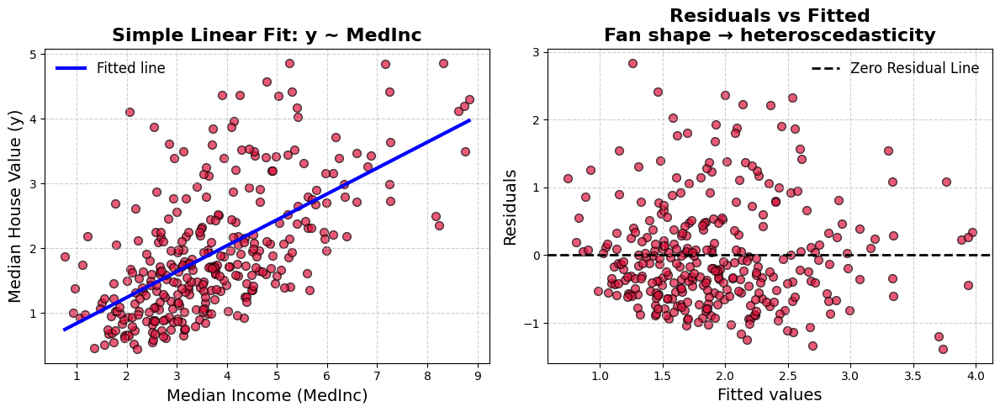

In [3]:
data = fetch_california_housing(as_frame=True)
df = data.frame.copy()

df = df[["MedInc", "MedHouseVal"]].rename(columns={"MedHouseVal": "y"})

# Filter data to remove extreme outliers
df = df[(df["MedInc"] < 10) & (df["y"] < 5)]

# Stratified subsample over MedInc quantiles to keep coverage but reduce clutter
np.random.seed(7)
q = pd.qcut(df["MedInc"], q=15, duplicates="drop")
sampled = (
    df.groupby(q, observed=True)
      .apply(lambda g: g.sample(n=min(len(g), 30), random_state=7))
      .reset_index(drop=True)
)

X = sampled[["MedInc"]].values
y = sampled["y"].values

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Fit linear regression
model = LinearRegression()
model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
y_pred_test  = model.predict(X_test)

resid_train = y_train - y_pred_train
resid_test  = y_test  - y_pred_test

# Metrics (test set)
mse = mean_squared_error(y_test, y_pred_test)
r2  = r2_score(y_test, y_pred_test)
n, p = X_test.shape[0], X_test.shape[1]
adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

print(f"Test MSE: {mse:.4f}")
print(f"Test R^2: {r2:.4f}")
print(f"Adjusted R^2: {adj_r2:.4f}")

def binned_trend(x, y, bins=12):
    edges = np.linspace(np.min(x), np.max(x), bins + 1)
    idx = np.digitize(x, edges) - 1
    xc = []
    yc = []
    for b in range(bins):
        mask = idx == b
        if np.any(mask):
            xc.append(np.mean(x[mask]))
            yc.append(np.mean(y[mask]))
    return np.array(xc), np.array(yc)

# Plot 1: Data & fitted line
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].scatter(X_train, y_train, s=50, alpha=0.7, edgecolor="k", color="crimson")
xline = np.linspace(X_train.min(), X_train.max(), 200).reshape(-1, 1)
yline = model.predict(xline)
axs[0].plot(xline, yline, lw=3, label="Fitted line", color="blue", zorder=3)
axs[0].set_xlabel("Median Income (MedInc)", fontsize=14)
axs[0].set_ylabel("Median House Value (y)", fontsize=14)
axs[0].set_title("Simple Linear Fit: y ~ MedInc", fontsize=16, fontweight="bold")
axs[0].legend(frameon=False, fontsize=12)
axs[0].grid(True, linestyle="--", alpha=0.6)

# Plot 2: Residuals vs Fitted 
axs[1].scatter(y_pred_train, resid_train, s=50, alpha=0.7, edgecolor="k", color="crimson")
axs[1].axhline(0, color="k", lw=2, ls="--", label="Zero Residual Line")
axs[1].set_xlabel("Fitted values", fontsize=14)
axs[1].set_ylabel("Residuals", fontsize=14)
axs[1].set_title("Residuals vs Fitted\nFan shape → heteroscedasticity", fontsize=16, fontweight="bold")
axs[1].legend(frameon=False, fontsize=12)
axs[1].grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

### **3. Regularization**

Regularization is designed to prevent overfitting by adding a penalty term to the loss function. This penalty discourages the model from assigning excessively large weights to features, and hence improving generalization. 

Two common types of regularization are: 1) **L2 (Ridge Regression)** and **L1 (Lasso Regression)**. 

**Ridge Regression** minimizes the sum of squared residuals with an additional penalty proportional to the square of the magnitude of coefficients, leading to shrinkage of all coefficients. 

**Lasso Regression**, on the other hand, uses the absolute value of coefficients for the penalty, which can shrink some coefficients to zero, effectively performing feature selection.

#### **3.1. L2 Regularization: Ridge Regression**

In [4]:
def plot_E_D():                  
    w0 = np.array([3.2, 0.9])
    theta = np.deg2rad(25)
    R = np.array([[np.cos(theta), -np.sin(theta)],
                    [np.sin(theta),  np.cos(theta)]])
    A = R @ np.diag([6.0, 1.0]) @ R.T * 2.5
    # ---------- Left panel grid ----------
    x = np.linspace(-10.0, 10.0, 501)
    y = np.linspace(-10.0,  10.0, 501)
    X, Y = np.meshgrid(x, y)
    U = np.stack([X - w0[0], Y - w0[1]], axis=-1)
    Z_ED = 0.5 * np.einsum("...i,...i", U, U @ A)

    zmin, zmax = 0.0, float(np.percentile(Z_ED, 95))

    fig = go.Figure()

    # Left: blue gradient + contour lines
    level_start = 0.01 * zmax          
    level_end   = 0.99 * zmax
    num_levels  = 20                  
    level_step  = (level_end - level_start) / num_levels

    fig.add_trace(go.Contour(
        x=x, y=y, z=np.clip(Z_ED, zmin, zmax),
        zmin=zmin, zmax=zmax,
        colorscale="Blues", reversescale=True,
        contours=dict(start=level_start, end=level_end, size=level_step,
                    showlines=False),
        connectgaps=True,
        showscale=False, opacity=0.96
    ))

    # Unregularized optimum (star)
    fig.add_trace(
        go.Scatter(
            x=[w0[0]], y=[w0[1]],
            mode="markers+text",
            marker=dict(symbol="star", size=14, color="crimson", line=dict(width=1)),
            textposition="top right",
            name="ŵ(λ=0) (no reg)"
        )
    )

    fig.update_layout(
        width=600, height=650, 
        template="plotly_white",
        title="Training loss with unregularized optimum", 
        xaxis_title="w₁",
        yaxis_title="w₂",
        xaxis=dict(scaleanchor="y", scaleratio=1,
                    zeroline=False, range=[x.min(), x.max()], title=dict(standoff=20)),
        yaxis=dict(zeroline=False, range=[y.min(), y.max()], title=dict(standoff=20)),
        showlegend=False 
    )
    fig.update_xaxes(range=[w0[0]-10, w0[0]+10])
    fig.update_yaxes(range=[w0[1]-10, w0[1]+10])

    return fig

plot_E_D().show()

In [5]:
def ridge_solution(lmbda, A, w0):
    w_hat = np.linalg.solve(A + lmbda*np.eye(2), A @ w0)
    ED = 0.5 * (w_hat - w0) @ A @ (w_hat - w0)
    EW = 0.5 * (w_hat @ w_hat)
    return w_hat, ED, EW, ED + lmbda*EW

In [6]:
def lasso_objective(w, A, w0, lmbda):
    # E_D(w) = 0.5 * (w - w0)ᵀ A (w - w0)
    ED = 0.5 * (w - w0).T @ A @ (w - w0)
    # E_W(w) = ||w||_1 = |w1| + |w2|
    EW_l1 = np.sum(np.abs(w))
    # Objective = E_D(w) + lambda * E_W(w)
    return ED + lmbda * EW_l1

In [7]:
from scipy.optimize import minimize
def lasso_solution(lmbda, A, w0):
    initial_guess = np.zeros(2) 

    result = minimize(lasso_objective, initial_guess, args=(A, w0, lmbda), method='Nelder-Mead', tol=1e-6)

    w_hat = result.x 
    ED = 0.5 * (w_hat - w0).T @ A @ (w_hat - w0)
    EW_l1 = np.sum(np.abs(w_hat)) 
    J = ED + lmbda * EW_l1 

    return w_hat, ED, EW_l1, J

In [8]:
w0 = np.array([3.2, 0.9])
theta = np.deg2rad(25)
R = np.array([[np.cos(theta), -np.sin(theta)],
                [np.sin(theta),  np.cos(theta)]])
A = R @ np.diag([6.0, 1.0]) @ R.T * 2.5

fig = plot_E_D()

lam = 0.0 

# ---------- Static traces (circle and optimum point for the chosen lambda) ----------
w, ED, EW, J = ridge_solution(lam, A, w0)
c = np.linalg.norm(w)
t = np.linspace(0, 2*np.pi, 400)
cx, cy = c*np.cos(t), c*np.sin(t)

fig.add_trace(go.Scatter(x=cx, y=cy, mode="lines",
                       line=dict(width=5, color="darkmagenta"), name="‖w‖₂ = c(λ)"))
fig.add_trace(go.Scatter(x=[w[0]], y=[w[1]], mode="markers",
                       marker=dict(size=12, symbol="x", color="teal"), name="ŵ(λ)"))

fig.show()

In [9]:
def plot_reg_with_regularization(func):
    w0 = np.array([3.2, 0.9])                 
    theta = np.deg2rad(25)
    R = np.array([[np.cos(theta), -np.sin(theta)],
                [np.sin(theta),  np.cos(theta)]])
    A = R @ np.diag([6.0, 1.0]) @ R.T * 2.5 
    x = np.linspace(-20.0, 20.0, 501)
    y = np.linspace(-10.0,  10.0, 501)
    X, Y = np.meshgrid(x, y)
    U = np.stack([X - w0[0], Y - w0[1]], axis=-1)
    Z_ED = 0.5 * np.einsum("...i,...i", U, U @ A)
    zmin, zmax = 0.0, float(np.percentile(Z_ED, 95))
    lams       = np.linspace(0.0, 15.0, 16)     
    lams_curve = np.linspace(0.0, 15.0, 600)    
    ED_curve, EW_curve = [], []
    for lam in lams_curve:
        _, ED, EW, _ = func(lam, A, w0)
        ED_curve.append(ED); EW_curve.append(EW)
    ED_curve = np.array(ED_curve); EW_curve = np.array(EW_curve)
    E_curve  = ED_curve + lams_curve * EW_curve
    ymax = float(E_curve.max()) * 1.05
    fig = make_subplots(
    rows=1, cols=2, column_widths=[0.55, 0.45],
    specs=[[{"type":"contour"}, {"type":"xy"}]]
    )
    fig.update_layout(template="plotly_white")

    level_start = 0.01 * zmax          
    level_end   = 0.99 * zmax
    num_levels  = 20                  
    level_step  = (level_end - level_start) / num_levels

    fig.add_trace(go.Contour(
        x=x, y=y, z=np.clip(Z_ED, zmin, zmax),
        zmin=zmin, zmax=zmax,
        colorscale="Blues", reversescale=True,
        contours=dict(start=level_start, end=level_end, size=level_step,
                    showlines=False),
        connectgaps=True,
        showscale=False, opacity=0.96
    ), row=1, col=1)


    fig.add_trace(
        go.Scatter(
            x=[w0[0]], y=[w0[1]],
            mode="markers+text",
            marker=dict(symbol="star", size=14, color="crimson", line=dict(width=1)),
            textposition="top right",
            name="ŵ(λ=0) (no reg)"
        ),
        row=1, col=1
    )

    # Right: curves (linear x-axis)
    fig.add_trace(go.Scatter(x=lams_curve, y=ED_curve,            mode="lines", line=dict(width=3),
                            name="E_D( ŵ(λ) )"), row=1, col=2)
    fig.add_trace(go.Scatter(x=lams_curve, y=lams_curve*EW_curve, mode="lines", line=dict(width=3),
                            name="λ · E_W( ŵ(λ) )"), row=1, col=2)
    fig.add_trace(go.Scatter(x=lams_curve, y=E_curve,             mode="lines", line=dict(width=3),
                            name="E( ŵ(λ) )"), row=1, col=2)

    # ---------- Dynamic traces ----------

    w, ED, EW, J = func(lam, A, w0)
    if func is ridge_solution:
        c = np.linalg.norm(w)
        t = np.linspace(0, 2*np.pi, 400)
        cx, cy = c*np.cos(t), c*np.sin(t)
    elif func is lasso_solution:
        c = np.linalg.norm(w, ord=1) 
        cx = c * np.array([1, 0, -1, 0, 1])
        cy = c * np.array([0, 1, 0, -1, 0])

    shape_tr = go.Scatter(x=cx, y=cy, mode="lines",
                        line=dict(width=5, color="darkmagenta"), name="‖w‖₂ = c(λ)")
    opt_tr    = go.Scatter(x=[], y=[], mode="markers",
                        marker=dict(size=12, symbol="x", color="teal"), name="ŵ(λ)")
    vline_tr  = go.Scatter(x=[], y=[], mode="lines",
                        line=dict(width=2, dash="dot", color="teal"), showlegend=False)
    ed_mk_tr  = go.Scatter(x=[], y=[], mode="markers+text", marker=dict(size=9),
                        text=[""], textposition="top center", showlegend=False)
    lew_mk_tr = go.Scatter(x=[], y=[], mode="markers+text", marker=dict(size=9),
                        text=[""], textposition="top center", showlegend=False)
    e_mk_tr   = go.Scatter(x=[], y=[], mode="markers+text", marker=dict(size=9),
                        text=[""], textposition="top center", showlegend=False)

    fig.add_trace(shape_tr, row=1, col=1)
    fig.add_trace(opt_tr,    row=1, col=1)
    fig.add_trace(vline_tr,  row=1, col=2)
    fig.add_trace(ed_mk_tr,  row=1, col=2)
    fig.add_trace(lew_mk_tr, row=1, col=2)
    fig.add_trace(e_mk_tr,   row=1, col=2)

    dyn_ix = list(range(len(fig.data)-6, len(fig.data)))  

    # ---------- Frames ----------
    frames = []
    for lam in lams:
        w, ED, EW, E = func(lam, A, w0)
        if func is ridge_solution:
            c = np.linalg.norm(w)
            t = np.linspace(0, 2*np.pi, 400)
            cx, cy = c*np.cos(t), c*np.sin(t)
        elif func is lasso_solution:
            c = np.linalg.norm(w, ord=1) 
            cx = c * np.array([1, 0, -1, 0, 1])
            cy = c * np.array([0, 1, 0, -1, 0])
        idx = int(np.argmin(np.abs(lams_curve - lam)))

        frames.append(go.Frame(
            name=f"{lam:.2f}",
            traces=dyn_ix,
            data=[
                go.Scatter(x=cx, y=cy),                                  
                go.Scatter(x=[w[0]], y=[w[1]]),                          
                go.Scatter(x=[lam, lam], y=[0, ymax]),                    
                go.Scatter(x=[lams_curve[idx]], y=[ED_curve[idx]],
                        text=[f"ED={ED_curve[idx]:.3f}"]),
                go.Scatter(x=[lams_curve[idx]], y=[lams_curve[idx]*EW_curve[idx]],
                        text=[f"λEw={(lams_curve[idx]*EW_curve[idx]):.3f}"]),
                go.Scatter(x=[lams_curve[idx]], y=[E_curve[idx]],
                        text=[f"E={E_curve[idx]:.3f}"]),
            ]
        ))
    fig.frames = frames

    # Initialize with first λ
    lam0 = float(lams[0])
    w_init, ED0, EW0, E0 = func(lam0, A, w0)

    i0 = int(np.argmin(np.abs(lams_curve - lam0)))
    if func is ridge_solution:
        c0 = np.linalg.norm(w_init)
        fig.data[dyn_ix[0]].update(x=c0*np.cos(t), y=c0*np.sin(t))
    elif func is lasso_solution:
        c0 = np.linalg.norm(w_init, ord=1)
        cx_init = c0 * np.array([1, 0, -1, 0, 1])
        cy_init = c0 * np.array([0, 1, 0, -1, 0])
        fig.data[dyn_ix[0]].update(x=cx_init, y=cy_init)
    fig.data[dyn_ix[1]].update(x=[w_init[0]], y=[w_init[1]])
    fig.data[dyn_ix[2]].update(x=[lam0, lam0], y=[0, ymax])
    fig.data[dyn_ix[3]].update(x=[lams_curve[i0]], y=[ED_curve[i0]], text=[f"ED={ED_curve[i0]:.3f}"])
    fig.data[dyn_ix[4]].update(x=[lams_curve[i0]], y=[lams_curve[i0]*EW_curve[i0]], text=[f"λEw={(lams_curve[i0]*EW_curve[i0]):.3f}"])
    fig.data[dyn_ix[5]].update(x=[lams_curve[i0]], y=[E_curve[i0]], text=[f"E={E_curve[i0]:.3f}"])  # fixed x to λ

    slider_steps = [{"label": f"λ = {lam:.2f}", "method": "animate",
                    "args": [[f"{lam:.2f}"],
                            {"mode": "immediate",
                            "frame": {"duration": 0, "redraw": True},
                            "transition": {"duration": 0}}]} for lam in lams]

    updatemenus = [dict(
        type="buttons", showactive=True, x=0.05, y=0, xanchor="left", yanchor="bottom",
        direction="left",  
        buttons=[
            dict(label="▶", method="animate",
                args=[None, {"fromcurrent": True,
                            "frame": {"duration": 600, "redraw": True},
                            "transition": {"duration": 50}}]),
            dict(label="⏸", method="animate",
                args=[[None], {"mode": "immediate",
                                "frame": {"duration": 0, "redraw": False},
                                "transition": {"duration": 0}}]),
        ]
    )]

    fig.update_layout(
        sliders=[dict(
            active=0,
            steps=slider_steps,
            pad=dict(l=120, t=60)
        )],
        updatemenus=updatemenus,
        uirevision="keep"
    )

    fig.update_xaxes(title_text="w₁", row=1, col=1, zeroline=False, range=[-10, 10], title=dict(standoff=20)) 
    fig.update_yaxes(title_text="w₂", row=1, col=1, zeroline=False, range=[-10, 10], title=dict(standoff=20), scaleanchor="x", scaleratio=1) 
    fig.update_xaxes(title_text="λ", row=1, col=2, title=dict(standoff=20)) 
    fig.update_xaxes(row=1, col=1, range=[w0[0]-10, w0[0]+10])
    fig.update_yaxes(row=1, col=1, range=[w0[1]-10, w0[1]+10])

    zmin, zmax = 0.0, float(np.percentile(Z_ED, 95))
    
    return fig

In [10]:
plot_reg_with_regularization(ridge_solution).show()

#### **3.2 L1 Regularization: Lasso Regression**

In [11]:
w0 = np.array([3.2, 0.9])
theta = np.deg2rad(25)
R = np.array([[np.cos(theta), -np.sin(theta)],
                [np.sin(theta),  np.cos(theta)]])
A = R @ np.diag([6.0, 1.0]) @ R.T * 2.5

fig = plot_E_D()

lam = 0.0 

w, ED, EW, J = lasso_solution(lam, A, w0)
c = np.linalg.norm(w, ord=1)
cx = c * np.array([1, 0, -1, 0, 1])
cy = c * np.array([0, 1, 0, -1, 0])

fig.add_trace(go.Scatter(x=cx, y=cy, mode="lines",
                       line=dict(width=5, color="darkmagenta"), name="‖w‖₂ = c(λ)"))
fig.add_trace(go.Scatter(x=[w[0]], y=[w[1]], mode="markers",
                       marker=dict(size=12, symbol="x", color="teal"), name="ŵ(λ)"))

fig.show()

In [12]:

fig = plot_reg_with_regularization(lasso_solution).show()

### **4. Impact of Regularization**

In [13]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

def plot_regularized_model_performance(regularized_model, ratio=0.8, degree=6):
    X = np.linspace(0, 1, 40).reshape(-1, 1)              
    y_true = 2* np.sin(2*np.pi*X).ravel()
    y = y_true + np.random.normal(0, 0.7, X.shape[0])  


    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=ratio, random_state=189
    )

    X_plot = np.linspace(0, 1, 400).reshape(-1, 1)
    y_true_plot = 2* np.sin(2*np.pi*X_plot).ravel()

    poly = PolynomialFeatures(degree=degree, include_bias=False)
    X_train_poly = poly.fit_transform(X_train)
    X_test_poly  = poly.transform(X_test)
    X_plot_poly  = poly.transform(X_plot)

    lambdas = np.array([100, 35, 20, 1, 0.2, 0.05, 0.01, 0.003, 0.0009, 0.00025, 0.00013])      # static curves
    lambda_slider = lambdas.copy()         

    train_mse, test_mse, pen_curve = [], [], []
    fits_over_lambda = []  
    models = []
    for a in lambdas:
        model_instance = regularized_model(alpha=a, fit_intercept=True)
        model_instance.fit(X_train_poly, y_train)
        models.append(model_instance)

        # Losses
        y_tr = model_instance.predict(X_train_poly)
        y_te = model_instance.predict(X_test_poly)
        train_mse.append(mean_squared_error(y_train, y_tr))
        test_mse.append(mean_squared_error(y_test,  y_te))

        # Penalty (intercept not penalized)
        w = model_instance.coef_.ravel()
        pen_curve.append(float(a * np.sum(w**2)))

        # Fitted curve on dense grid (LEFT plot)
        fits_over_lambda.append(model_instance.predict(X_plot_poly))

    train_mse = np.array(train_mse)
    test_mse  = np.array(test_mse)
    pen_curve = np.array(pen_curve)
    train_obj = train_mse + pen_curve
    test_obj  = test_mse  + pen_curve
    right_ymax = 1.05 * float(max(train_obj.max(), test_obj.max()))
    right_ymin = 0.95 * float(min(train_obj.min(), test_obj.min()))

    fits_over_alpha = np.vstack(fits_over_lambda) 

    y_left_all = np.concatenate([y_train, y_test, y_true_plot])
    ymin_left, ymax_left = float(y_left_all.min()), float(y_left_all.max())
    pad = max(0.25, 0.10*(ymax_left - ymin_left))
    ymin_left -= pad; ymax_left += pad

    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=("Fitted Function with Train/Test",
                        "Loss vs λ — Train/Test MSE"),
        specs=[[{"type":"xy"}, {"type":"xy"}]],
        column_widths=[0.55, 0.45]
    )

    # LEFT (static)
    fig.add_trace(go.Scatter(x=X_train.ravel(), y=y_train, mode='markers',
                            name='Training data', marker=dict(size=7)),
                row=1, col=1)
    fig.add_trace(go.Scatter(x=X_test.ravel(), y=y_test, mode='markers',
                            name='Testing data', marker=dict(size=7, symbol='square')),
                row=1, col=1)
    fig.add_trace(go.Scatter(x=X_plot.ravel(), y=y_true_plot, mode='lines',
                            name='True sin(x)', line=dict(width=2, dash='dot')),
                row=1, col=1)

    # LEFT (dynamic)
    fit_tr = go.Scatter(x=[], y=[], mode='lines',
                        name='Fitted', line=dict(color='red', width=3))
    fig.add_trace(fit_tr, row=1, col=1)

    # RIGHT (static)
    fig.add_trace(go.Scatter(x=lambdas, y=train_mse, mode='lines',
                            name='Train MSE', line=dict(width=3)),
                row=1, col=2)
    fig.add_trace(go.Scatter(x=lambdas, y=test_mse, mode='lines',
                            name='Test MSE', line=dict(width=3)),
                row=1, col=2)

    # RIGHT (dynamic): vertical λ + 4 markers at current λ
    vline_tr = go.Scatter(x=[], y=[], mode='lines',
                        line=dict(color='crimson', dash='dot', width=2),
                        showlegend=False)
    mk_tr_mse = go.Scatter(x=[], y=[], mode='markers+text', text=[""],
                        marker=dict(size=9), textposition="top center", showlegend=False)
    mk_te_mse = go.Scatter(x=[], y=[], mode='markers+text', text=[""],
                        marker=dict(size=9), textposition="top center", showlegend=False)

    fig.add_trace(vline_tr, row=1, col=2)
    fig.add_trace(mk_tr_mse, row=1, col=2)
    fig.add_trace(mk_te_mse, row=1, col=2)

    dyn_ix = [3, 6, 7, 8]


    def nearest_idx(arr, val): return int(np.argmin(np.abs(arr - val)))

    # ---------- Frames (each λ updates the left fit + right markers/line) ----------
    frames = []
    for i, a in enumerate(lambda_slider):  
        j = nearest_idx(lambdas, a)  
        frames.append(go.Frame(
            name=f"{a:.5f}",
            traces=dyn_ix,
            data=[
                go.Scatter(x=X_plot.ravel(), y=fits_over_alpha[j]),   
                go.Scatter(x=[a, a], y=[0, right_ymax]),             
                go.Scatter(x=[lambdas[j]], y=[train_mse[j]]),
                go.Scatter(x=[lambdas[j]], y=[test_mse[j]])
            ],
        ))
    fig.frames = frames

    alpha0 = float(lambda_slider[0])
    j0 = nearest_idx(lambdas, alpha0)
    fig.data[dyn_ix[0]].update(x=X_plot.ravel(), y=fits_over_alpha[j0])  
    fig.data[dyn_ix[1]].update(x=[alpha0, alpha0], y=[0, right_ymax])
    fig.data[dyn_ix[2]].update(x=[lambdas[j0]], y=[train_mse[j0]])
    fig.data[dyn_ix[3]].update(x=[lambdas[j0]], y=[test_mse[j0]])

    slider_steps = [{"label": f"λ = {a:.2f}", "method": "animate",
                    "args": [[f"{a:.5f}"],
                            {"mode": "immediate",
                            "frame": {"duration": 0, "redraw": True},
                            "transition": {"duration": 0}}]} for a in lambda_slider]

    updatemenus = [dict(
        type="buttons", showactive=True, x=0.05, y=0, xanchor="left", yanchor="bottom",
        direction="left",  
        buttons=[
            dict(label="▶", method="animate",
                args=[None, {"fromcurrent": True,
                            "frame": {"duration": 600, "redraw": True},
                            "transition": {"duration": 50}}]),
            dict(label="⏸", method="animate",
                args=[[None], {"mode": "immediate",
                                "frame": {"duration": 0, "redraw": False},
                                "transition": {"duration": 0}}]),
        ]
    )]

    fig.update_layout(
        sliders=[dict(
            active=0,
            steps=slider_steps,
            pad=dict(l=120, t=60)
        )],
        updatemenus=updatemenus
    )

    fig.update_xaxes(title_text='x', row=1, col=1, range=[0, 1])
    fig.update_yaxes(title_text='y', row=1, col=1, range=[ymin_left-0.5, ymax_left+0.5])  
    fig.update_xaxes(title_text='λ (log scale)', type='log', row=1, col=2)
    fig.update_yaxes(title_text='Loss', row=1, col=2, range=[-0.5, right_ymax+0.5], rangemode='tozero')
    fig.update_layout(template="plotly_white")
    return fig, models

In [14]:
def display_coefficients(models):
    models_df = pd.DataFrame(models, columns=["Model"])
    
    coefficients_data = {}
    for index, row in models_df.iterrows():
        model = row["Model"]  
        alpha_value = model.alpha  
        coefficients = model.coef_.ravel()  

        coefficients_data[f'lambda={alpha_value:.5e}'] = coefficients

    coefficients_df = pd.DataFrame(coefficients_data)
    coefficients_df = coefficients_df.rename_axis("Polynomial Degree")  
    return coefficients_df

In [15]:
fig, models = plot_regularized_model_performance(Ridge, ratio=0.85, degree=8)

fig.show()

In [16]:
display_coefficients(models)

,lambda=1.00000e+02,lambda=3.50000e+01,lambda=2.00000e+01,lambda=1.00000e+00,lambda=2.00000e-01,lambda=5.00000e-02,lambda=1.00000e-02,lambda=3.00000e-03,lambda=9.00000e-04,lambda=2.50000e-04,lambda=1.30000e-04
Polynomial Degree,,,,,,,,,,,
0,-0.017751,-0.049364,-0.083858,-0.867799,-1.971344,-2.801434,-2.668770,-1.899169,-0.333653,3.698331,7.185844
1,-0.014509,-0.040114,-0.067700,-0.585465,-1.138454,-1.752409,-2.854673,-4.542170,-8.610478,-19.897083,-29.696060
2,-0.011541,-0.031736,-0.053231,-0.372625,-0.509276,-0.667725,-1.146779,-1.551501,-1.726829,-1.711894,-1.832032
3,-0.009180,-0.025114,-0.041876,-0.226045,-0.094768,0.099352,0.278190,0.954991,3.529108,11.381136,18.290264
4,-0.007387,-0.020114,-0.033355,-0.129661,0.155539,0.554889,1.066251,1.999734,4.756119,12.910703,20.275826
5,-0.006041,-0.016379,-0.027026,-0.068088,0.294151,0.784676,1.350752,1.943162,3.158980,6.523916,9.677905
6,-0.005023,-0.013569,-0.022293,-0.029649,0.361354,0.870523,1.329950,1.303209,0.262317,-3.300485,-6.458779
7,-0.004241,-0.011422,-0.018697,-0.006230,0.384844,0.872153,1.157331,0.461413,-2.866757,-13.454002,-23.157161


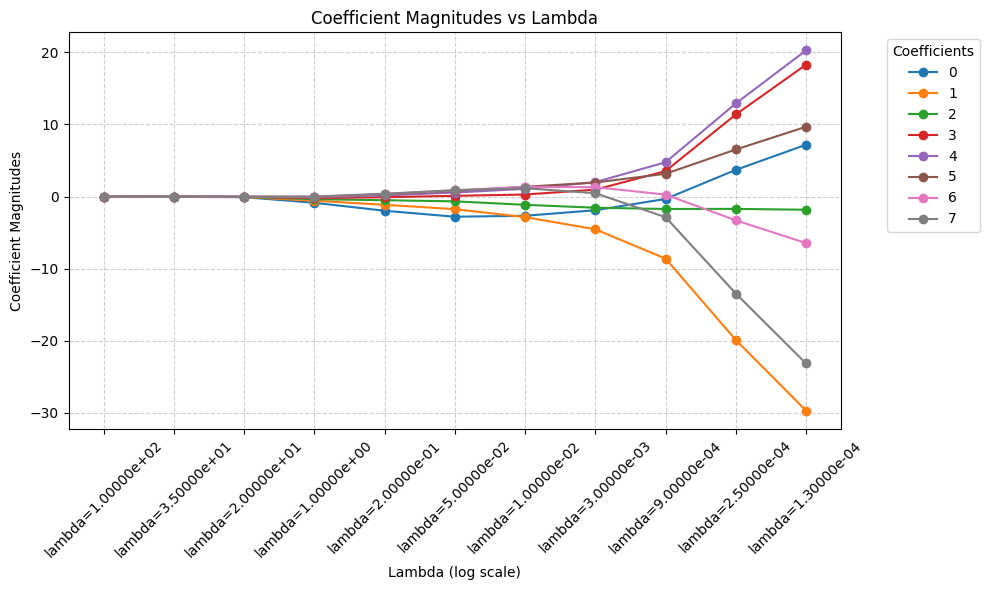

In [17]:
coefficients_df = display_coefficients(models)
coefficients_df.T.plot(kind='line', figsize=(10, 6), marker='o')
plt.title("Coefficient Magnitudes vs Lambda")
plt.xlabel("Lambda (log scale)")
plt.ylabel("Coefficient Magnitudes")
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="Coefficients", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xticks(ticks=range(len(coefficients_df.columns)), labels=coefficients_df.columns, rotation=45)

plt.tight_layout()
plt.show()


In [18]:
fig, models = plot_regularized_model_performance(Lasso, ratio=0.85, degree=8)

fig.show()

In [19]:
display_coefficients(models)

,lambda=1.00000e+02,lambda=3.50000e+01,lambda=2.00000e+01,lambda=1.00000e+00,lambda=2.00000e-01,lambda=5.00000e-02,lambda=1.00000e-02,lambda=3.00000e-03,lambda=9.00000e-04,lambda=2.50000e-04,lambda=1.30000e-04
Polynomial Degree,,,,,,,,,,,
0,-0.0,-0.0,-0.0,-0.0,-0.707907,-0.251317,1.702479,7.517195,9.616558,10.868024,11.268420
1,-0.0,-0.0,-0.0,-0.0,-0.336051,-2.975911,-7.738406,-15.327377,-18.166984,-20.348628,-21.222468
2,-0.0,-0.0,-0.0,-0.0,-0.000000,-0.000000,-1.693343,-4.416693,-5.958836,-7.101165,-7.458504
3,-0.0,-0.0,-0.0,-0.0,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
4,-0.0,-0.0,-0.0,-0.0,-0.000000,0.000000,0.000000,0.000000,0.000000,0.801914,3.583376
5,-0.0,-0.0,-0.0,-0.0,-0.000000,0.000000,0.000000,0.000000,0.000000,8.255066,7.315588
6,-0.0,-0.0,-0.0,-0.0,-0.000000,0.000000,0.000000,0.000000,10.736456,6.817738,6.111916
7,-0.0,-0.0,-0.0,-0.0,-0.000000,0.000000,7.594863,15.769233,7.828731,4.439485,3.997749


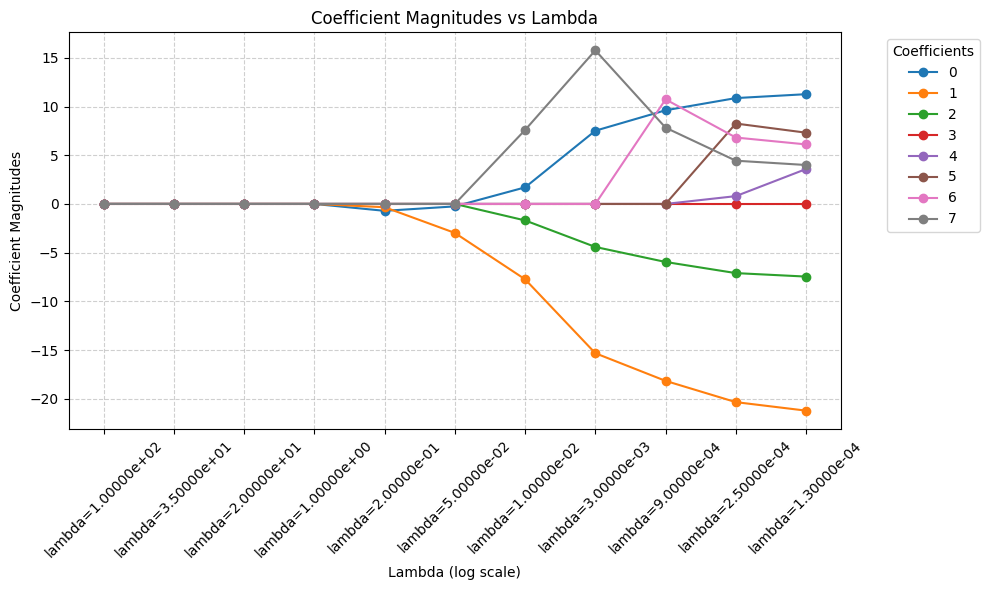

In [20]:
coefficients_df = display_coefficients(models)
coefficients_df.T.plot(kind='line', figsize=(10, 6), marker='o')
plt.title("Coefficient Magnitudes vs Lambda")
plt.xlabel("Lambda (log scale)")
plt.ylabel("Coefficient Magnitudes")
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="Coefficients", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xticks(ticks=range(len(coefficients_df.columns)), labels=coefficients_df.columns, rotation=45)

plt.tight_layout()
plt.show()

### **5. Illconditioning**

In [21]:
# --- 1. Build a nearly collinear design matrix ----------------------------
N, D = 500, 2                       # one bias + 2 features
X = np.ones((N, D + 1))             # first column = bias
x1 = np.random.randn(N)
x2 = x1 + 1e-4 * np.random.randn(N) # almost identical feature
X[:, 1] = x1
X[:, 2] = x2

t = 3 + 2*x1 - 1*x2 + 0.1*np.random.randn(N)  # ground-truth weights [3,2,-1]

# --- 2. Normal equation solution ------------------------------------------
XtX   = X.T @ X
Xty   = X.T @ t
w_ne  = np.linalg.solve(XtX, Xty)

# --- 3. Condition number ---------------------------------------------------
u, s, vt = np.linalg.svd(X, full_matrices=False)
kappa = s.max() / s.min()

# --- 4. Ridge (λ = 1e-2) ---------------------------------------------------
lam   = 1e-2
w_ridge = np.linalg.solve(XtX + lam*np.eye(D+1), Xty)

print("cond(X^T X)  =", kappa**2)        # κ^2 because XtX squares the singular values
print("Weights via normal eq.:", w_ne)
print("Weights via ridge     :", w_ridge)

cond(X^T X)  = 407090573.7640836
Weights via normal eq.: [  3.00168842  43.94214953 -42.94625646]
Weights via ridge     : [3.00156978 0.50871323 0.48753383]
